# VOLVE WAVEFIELD SEPARATION

## Author: N. Wang

In [72]:
import warnings
warnings.filterwarnings('ignore')

import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import segyio

from scipy.signal import butter, lfilter, freqz, medfilt, fftconvolve
from scipy.sparse import csr_matrix, vstack
from scipy.signal import filtfilt
from scipy.linalg import lstsq, solve
from scipy.sparse.linalg import LinearOperator, cg, lsqr
from scipy import misc

from segyshot import SegyShot
from wavefieldsep import wavefield_separation

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [440]:
# Input data (download both datasets directly from Volve village)
inputfile = '../data/ST10010_1150780_40203.sgy'
velfile = '../data/ST10010ZC11-MIG-VEL.MIG_VEL.VELOCITY.3D.JS-017527.segy'

f = segyio.open(inputfile, ignore_geometry=True)
fv = segyio.open(velfile, ignore_geometry=True)

# Depth axes
z = fv.samples
il, xl = fv.ilines, fv.xlines

# Velocity model
vmod = segyio.cube(velfile)
np.shape(vmod)

(109, 241, 226)

In [494]:
# Trace header
print('First trace header', f.header[0])
print('GroupX from first trace header', f.header[0][segyio.TraceField.GroupX])

First trace header {TRACE_SEQUENCE_LINE: 1, TRACE_SEQUENCE_FILE: 28801, FieldRecord: 1000, TraceNumber: 1, EnergySourcePoint: 1000, CDP: 10205120, CDP_TRACE: 0, TraceIdentificationCode: 1, NSummedTraces: 0, NStackedTraces: 0, DataUse: 1, offset: 3109, ReceiverGroupElevation: -1010, SourceSurfaceElevation: -2, SourceDepth: 62, ReceiverDatumElevation: 0, SourceDatumElevation: 0, SourceWaterDepth: 1060, GroupWaterDepth: 1010, ElevationScalar: -10, SourceGroupScalar: -10, SourceX: 4280572, SourceY: 64774885, GroupX: 4311640, GroupY: 64776128, CoordinateUnits: 1, WeatheringVelocity: 0, SubWeatheringVelocity: 0, SourceUpholeTime: 0, GroupUpholeTime: 0, SourceStaticCorrection: 0, GroupStaticCorrection: 0, TotalStaticApplied: 0, LagTimeA: 0, LagTimeB: 0, DelayRecordingTime: 0, MuteTimeStart: 0, MuteTimeEND: 0, TRACE_SAMPLE_COUNT: 5000, TRACE_SAMPLE_INTERVAL: 2000, GainType: 1, InstrumentGainConstant: 6, InstrumentInitialGain: 0, Correlated: 0, SweepFrequencyStart: 0, SweepFrequencyEnd: 0, Swee

In [495]:
# EBCDIC header containing textual information of the data
print(segyio.tools.wrap(f.text[0]))  
print(f.bin)
print('JobID from binary header: ', f.bin[segyio.BinField.JobID])

C 1 CLIENT: STATOIL           COMPANY: RESERVOIR EXPLORATION TECHNOLOGY
C 2 AREA: VOLVE NORWAY BLOCK 15/9                SURVEY: ST10010
C 3 SWATH:  11                             VESSELS:M/V VIKLAND, M/V SANCO
SPIRITC 4 RCV LINE: 1150780    RCVR RANGE: 1239-1717
C 5 DATA-SET: NAV MERGE   TRACES PER RECORD: 240 X 4   SEQ: 094-133
C 6 RECORDING FORMAT: IEEE SEG-Y           FORMAT THIS REEL: SEG-Y 3592
C 7 SAMPLE CODE: FLOATING PT               PROCESSED: 03/11/2010
C 8 ACQ. GEOM: 8 ROLL 8  INLINE SWATH      LINE PREFIX: ST10010
C 9 INSTRUMENT: VECTORSEIS OCEAN BOTTOM    RECORDING SYSTEM DELAY: 0 MS
C10 RECORDING FILTER: 1.5/6-187/260MIN PHS DESCRIPTION: HZ/DB PER OCTAVE
C11 NO OF RECEIVER LINES/SWATH: 8          RECEIVER LINE SEPARATION: 400/200M
C12 ACTIVE CABLE LENGTH: 5975M             RCVRS / RCV LINE 240 X 4
C13 NO OF SOURCES:  2                      SOURCE SEPARATION: 50M
C14 RECEIVER INTERVAL: 25M                 SHOT INTERVAL: 25M, FLIP/FLOP
C15 DATUM: ED50, 31N  SPHEROID: INT. 

In [515]:
# Trace header
print('First trace header', f.header[0])
print('GroupX from first trace header', f.header[0][segyio.TraceField.GroupX])

First trace header {TRACE_SEQUENCE_LINE: 1, TRACE_SEQUENCE_FILE: 28801, FieldRecord: 1000, TraceNumber: 1, EnergySourcePoint: 1000, CDP: 10205120, CDP_TRACE: 0, TraceIdentificationCode: 1, NSummedTraces: 0, NStackedTraces: 0, DataUse: 1, offset: 3109, ReceiverGroupElevation: -1010, SourceSurfaceElevation: -2, SourceDepth: 62, ReceiverDatumElevation: 0, SourceDatumElevation: 0, SourceWaterDepth: 1060, GroupWaterDepth: 1010, ElevationScalar: -10, SourceGroupScalar: -10, SourceX: 4280572, SourceY: 64774885, GroupX: 4311640, GroupY: 64776128, CoordinateUnits: 1, WeatheringVelocity: 0, SubWeatheringVelocity: 0, SourceUpholeTime: 0, GroupUpholeTime: 0, SourceStaticCorrection: 0, GroupStaticCorrection: 0, TotalStaticApplied: 0, LagTimeA: 0, LagTimeB: 0, DelayRecordingTime: 0, MuteTimeStart: 0, MuteTimeEND: 0, TRACE_SAMPLE_COUNT: 5000, TRACE_SAMPLE_INTERVAL: 2000, GainType: 1, InstrumentGainConstant: 6, InstrumentInitialGain: 0, Correlated: 0, SweepFrequencyStart: 0, SweepFrequencyEnd: 0, Swee

Local regular axis:
 ox=0.000000, dx=49.793406 nx=241
 oy=-0.000000, dy=49.540976 ny=109


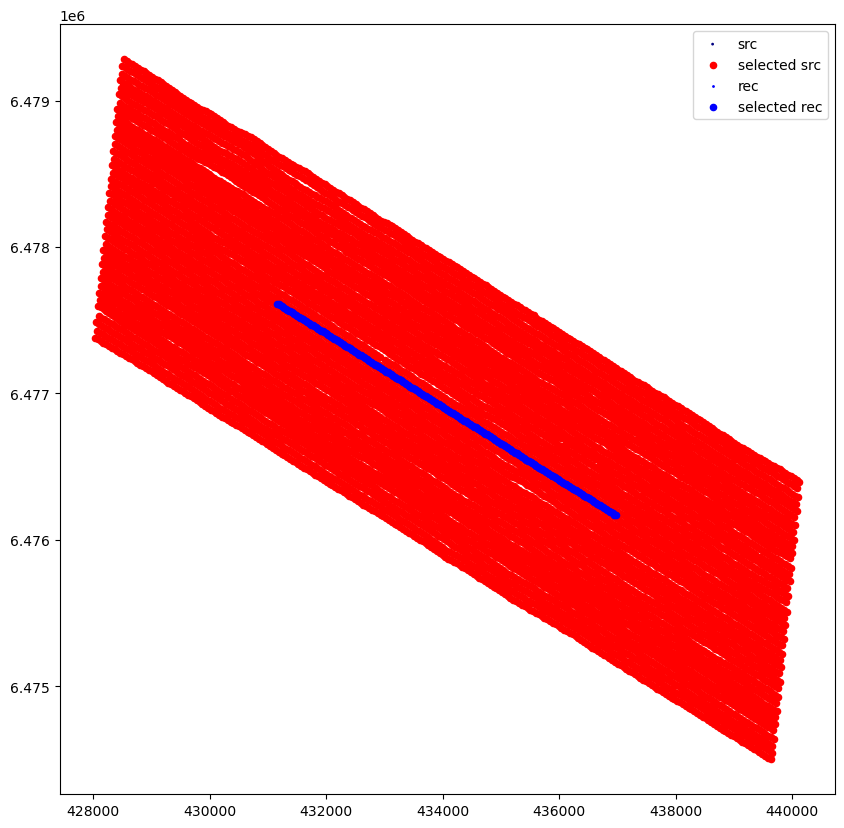

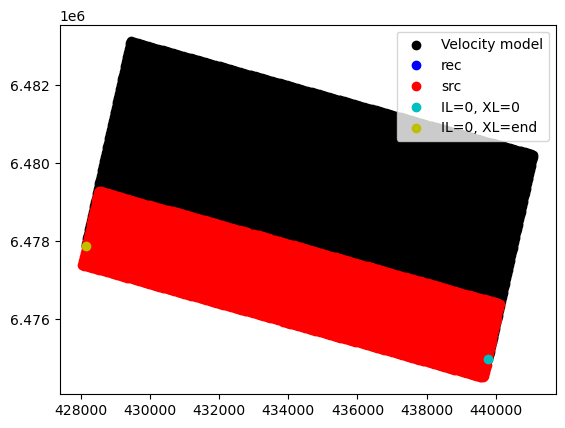

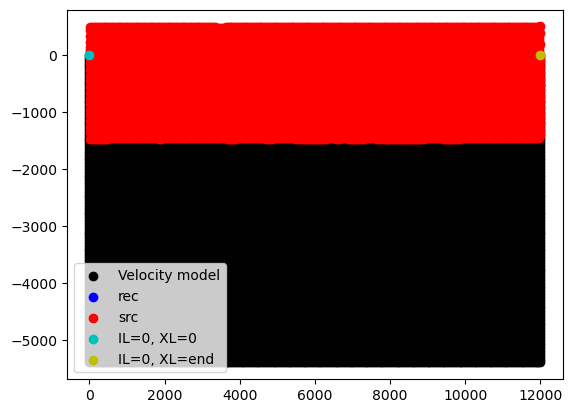

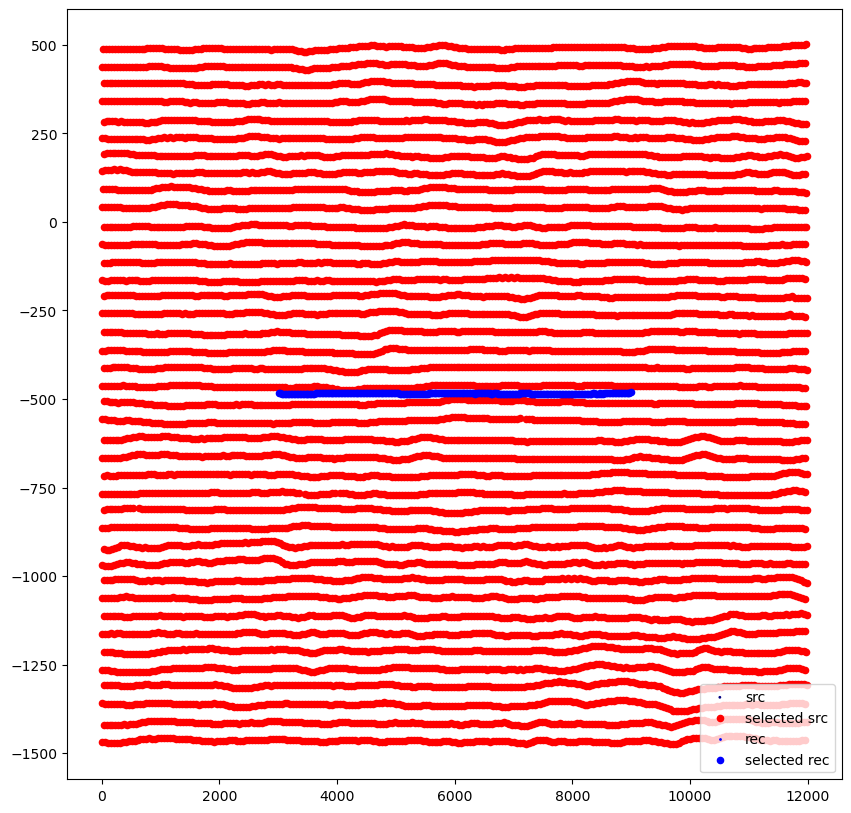

In [496]:
# Shot gather
sg = SegyShot(inputfile, components=['P', 'VZ', 'VX', 'VY'])
sg.interpret()
sg.showgeometry()
sg.rotategeometry(velfile=velfile, plotflag=1)
sg.showgeometry(local=True)

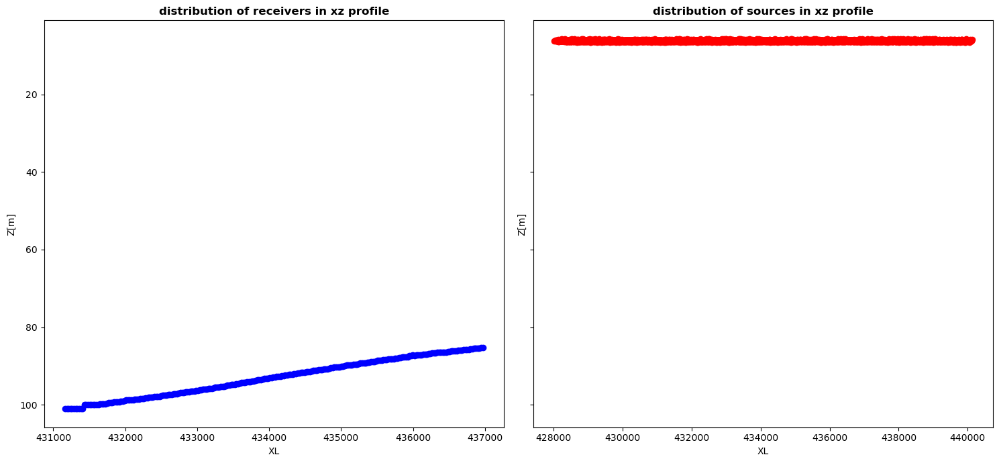

In [497]:
recx=sg.recx
recy=sg.recy
recz=sg.recz
srcx=sg.srcx
srcy=sg.srcy
srcz=sg.srcz
num_rec=np.shape(recx)
num_src=np.shape(srcx)

fig, axs = plt.subplots(1, 2, figsize=(15, 7), sharey=True)
axs[0].scatter(recx,recz,c='b')
axs[0].set_title('distribution of receivers in xz profile', fontweight='bold')
axs[0].set_xlabel('XL')
axs[0].set_ylabel('Z[m]')
axs[0].invert_yaxis()
axs[0].axis('tight')

axs[1].scatter(srcx,srcz,c='r')
axs[1].set_title('distribution of sources in xz profile', fontweight='bold')
axs[1].set_xlabel('XL')
axs[1].set_ylabel('Z[m]')
axs[1].axis('tight')
plt.tight_layout();

In [498]:
num_rec

(240,)

In [499]:
num_src

(9596,)

In [500]:
# Velocity file
fv = segyio.open(velfile)

# Depth axes 0-4500
z = fv.samples

# Inline and crossline axes str:9963(432) str:1840(960)
il, xl = fv.ilines, fv.xlines

# Velocity model (il,xl,z) (109,241,226)
vmod = segyio.cube(velfile)
num_il=np.shape(il)[0]

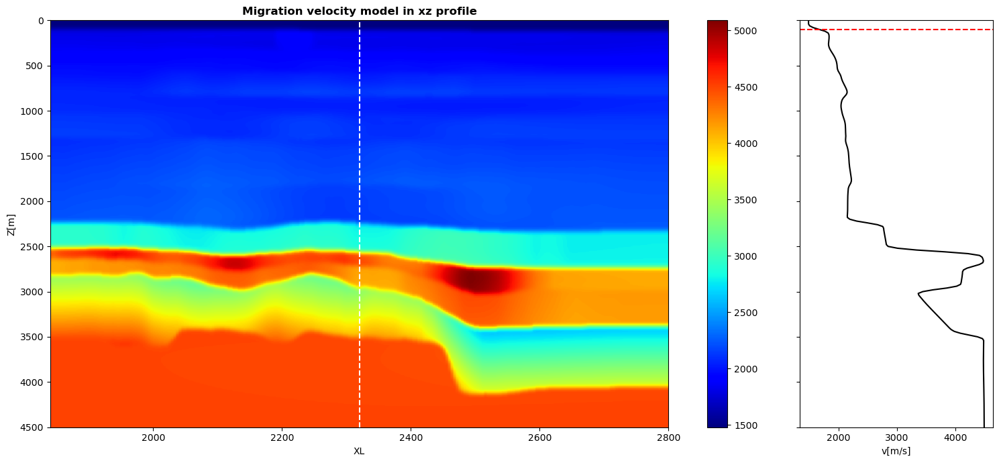

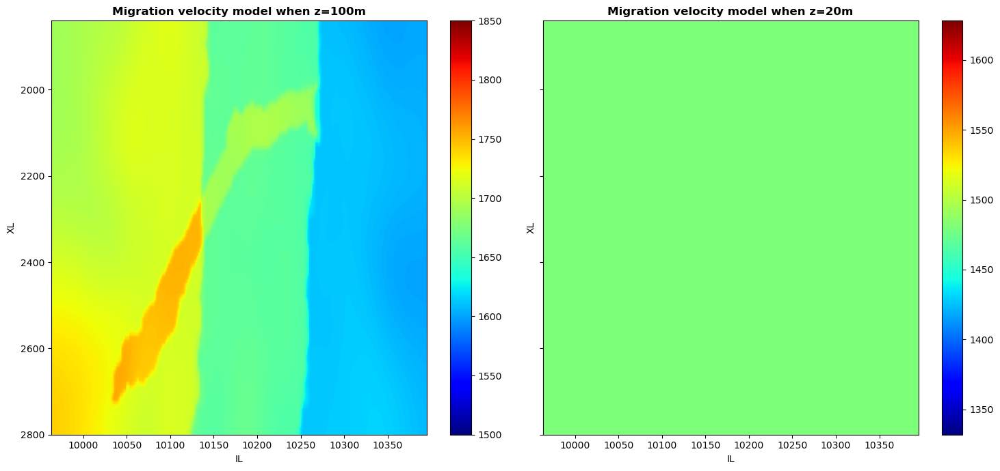

In [501]:
fig, axs = plt.subplots(1, 2, figsize=(15, 7), sharey=True, gridspec_kw={'width_ratios': [4, 1]})
ax1=axs[0].imshow(vmod[(num_il//2)].T, extent=(xl[0], xl[-1], z[-1], z[0]), cmap='jet')
axs[0].set_title('Migration velocity model in xz profile', fontweight='bold')
axs[0].axvline(xl[120], color='w', linestyle='--')
axs[0].set_xlabel('XL')
axs[0].set_ylabel('Z[m]')
fig.colorbar(ax1,ax=axs[0])
axs[0].axis('tight')
axs[1].plot(vmod[50, 120], z, 'k')
axs[1].set_xlabel('v[m/s]')
axs[1].axhline(z[5], color='r', linestyle='--')
plt.tight_layout();

fig, axs = plt.subplots(1, 2, figsize=(15, 7), sharey=True)
axs0=axs[0].imshow(vmod[:,:,5], cmap='jet',extent=( il[0], il[-1],xl[-1], xl[0]), vmin=1500,vmax=1850)
axs[0].set_title('Migration velocity model when z=100m', fontweight='bold')
axs[0].set_xlabel('IL')
axs[0].set_ylabel('XL')
axs[0].axis('tight')
fig.colorbar(axs0,ax=axs[0])
axs1=axs[1].imshow(vmod[:,:,1], extent=(il[0], il[-1], xl[-1], xl[0]), cmap='jet')
axs[1].set_title('Migration velocity model when z=20m', fontweight='bold')
axs[1].set_xlabel('IL')
axs[1].set_ylabel('XL')
axs[1].axis('tight')
fig.colorbar(axs1,ax=axs[1])
plt.tight_layout();

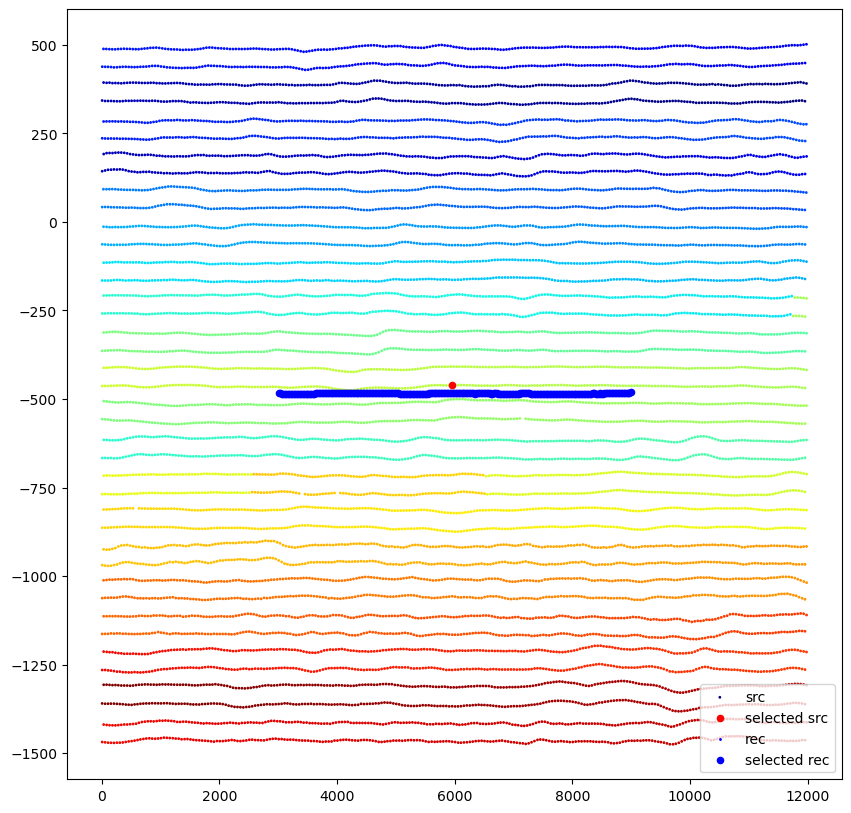

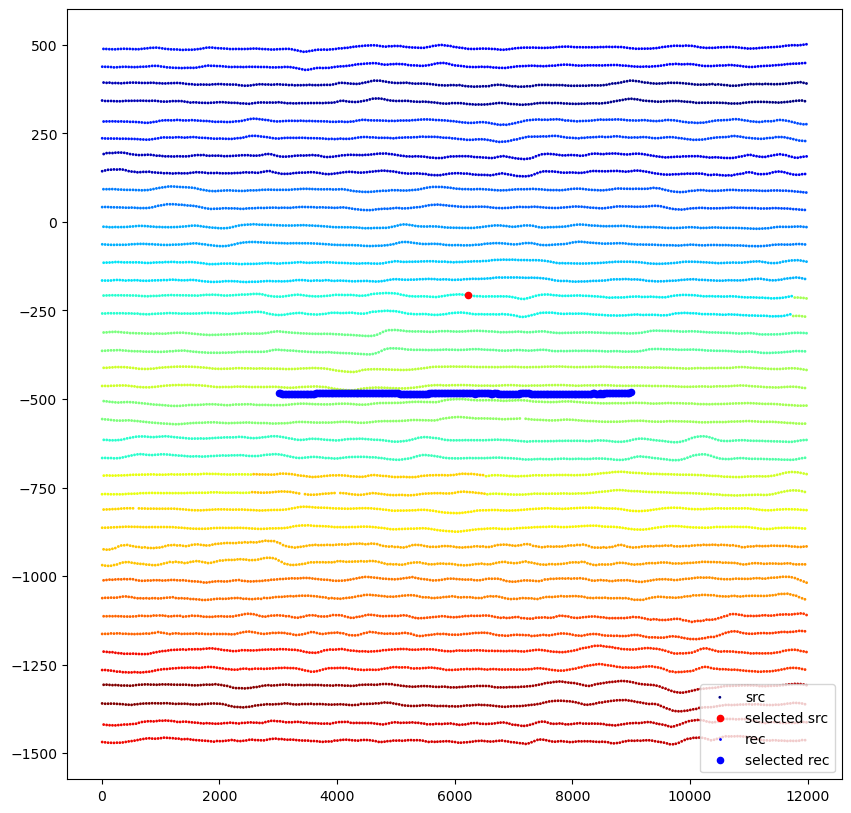

In [502]:
# Select two shots and set of receivers (2D line)
vwater = 1500.

# Load shot gather 1
ishotc = 5520
sg.selectsrcs(ishotc, ishotc+1, plotflag=False)
sg.showgeometry(local=True)
shot1 = sg.get_shotgather(ishotc)

# Load shot gather 2
ishotc = 3580
sg.selectsrcs(ishotc, ishotc+1, plotflag=False)
sg.showgeometry(local=True)
shot2 = sg.get_shotgather(ishotc)


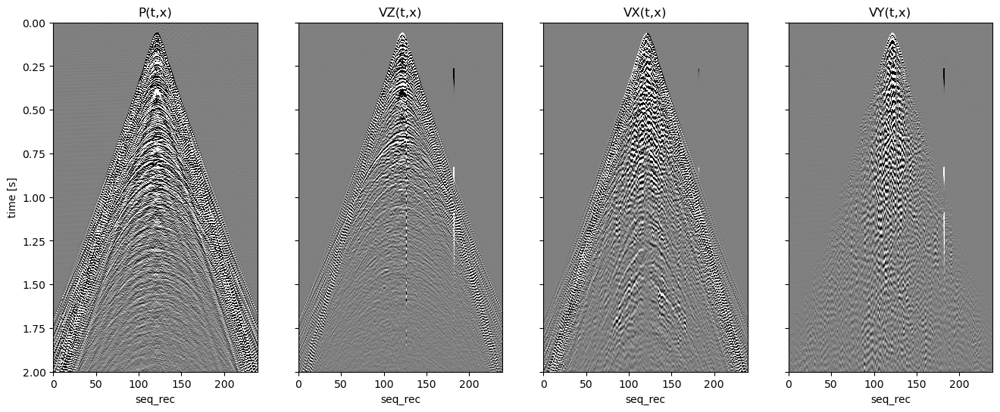

In [503]:
# Display 
a=range(0,240)
vmax = 2e5
cmap = 'gray'
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 6))
axs[0].imshow(shot1['P'].T, cmap=cmap, vmin=-vmax, vmax=vmax,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('P(t,x)')
axs[0].set_xlabel('seq_rec')
axs[0].set_ylabel('time [s]')
axs[0].axis('tight')
axs[1].imshow(shot1['VZ'].T, cmap=cmap, vmin=-vmax/10, vmax=vmax/10,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('VZ(t,x)')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[2].imshow(shot1['VX'].T, cmap=cmap, vmin=-vmax/10, vmax=vmax/10,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[2].set_title('VX(t,x)')
axs[2].set_xlabel('seq_rec')
axs[2].axis('tight')
axs[3].imshow(shot1['VY'].T, cmap=cmap, vmin=-vmax/10, vmax=vmax/10,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[3].set_title('VY(t,x)')
axs[3].set_xlabel('seq_rec')
axs[3].axis('tight')
axs[3].set_ylim(2, 0);

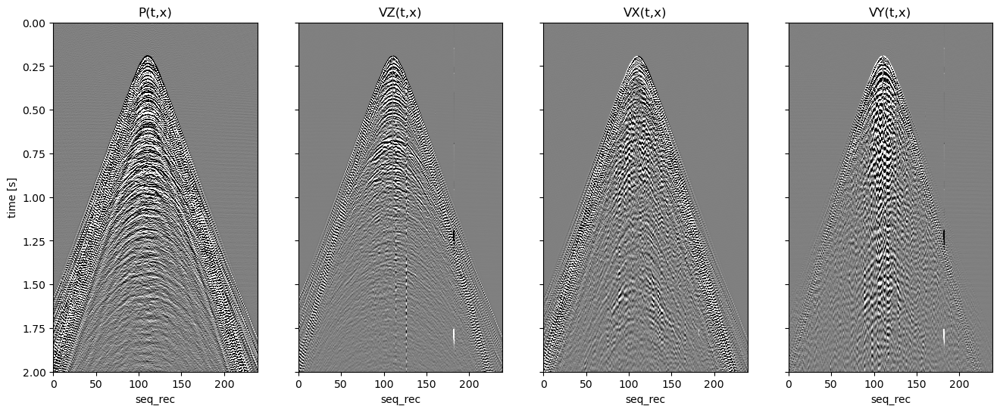

In [504]:
# Display 
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 6))
axs[0].imshow(shot2['P'].T, cmap=cmap, vmin=-vmax, vmax=vmax,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('P(t,x)')
axs[0].set_xlabel('seq_rec')
axs[0].set_ylabel('time [s]')
axs[0].axis('tight')
axs[1].imshow(shot2['VZ'].T, cmap=cmap, vmin=-vmax/10, vmax=vmax/10,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('VZ(t,x)')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[2].imshow(shot2['VX'].T, cmap=cmap, vmin=-vmax/10, vmax=vmax/10,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[2].set_title('VX(t,x)')
axs[2].set_xlabel('seq_rec')
axs[2].axis('tight')
axs[3].imshow(shot2['VY'].T, cmap=cmap, vmin=-vmax/10, vmax=vmax/10,
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[3].set_title('VY(t,x)')
axs[3].set_xlabel('seq_rec')
axs[3].axis('tight')
axs[3].set_ylim(2, 0);

In [534]:
# remove the bad traces away
p1=shot1['P']
p1=np.delete(p1,182,axis=0)
p1=np.delete(p1,126,axis=0)
p1=np.delete(p1,114,axis=0)
p1=np.delete(p1,110,axis=0)
vz1=shot1['VZ']
vz1=np.delete(vz1,182,axis=0)
vz1=np.delete(vz1,126,axis=0)
vz1=np.delete(vz1,114,axis=0)
vz1=np.delete(vz1,110,axis=0)

p2=shot2['P']
p2=np.delete(p2,182,axis=0)
p2=np.delete(p2,126,axis=0)
p2=np.delete(p2,114,axis=0)
p2=np.delete(p2,110,axis=0)
vz2=shot2['VZ']
vz2=np.delete(vz2,182,axis=0)
vz2=np.delete(vz2,126,axis=0)
vz2=np.delete(vz2,114,axis=0)
vz2=np.delete(vz2,110,axis=0)

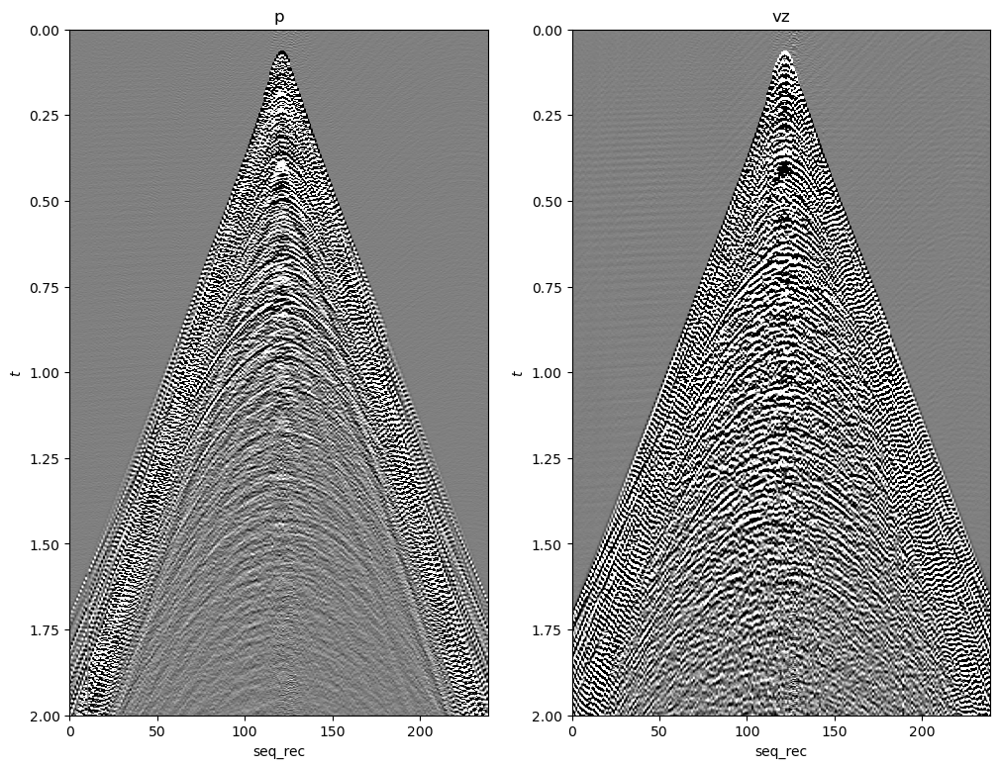

In [535]:
# -------------------p1 vz1 after removing the bad traces away-----------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 9))
axs[0].imshow(p1.T, cmap='gray', vmin=-0.0007*np.abs(p1).max(), vmax=0.0007*np.abs(p1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('p'),  axs[0].set_ylabel(r'$t$')
axs[0].set_xlabel('seq_rec')
axs[0].axis('tight')
axs[0].set_ylim(2, 0);
axs[1].imshow(vz1.T, cmap='gray', vmin=-0.0007*np.abs(vz1).max(), vmax=0.0007*np.abs(vz1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('vz'), axs[1].set_ylabel(r'$t$')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);

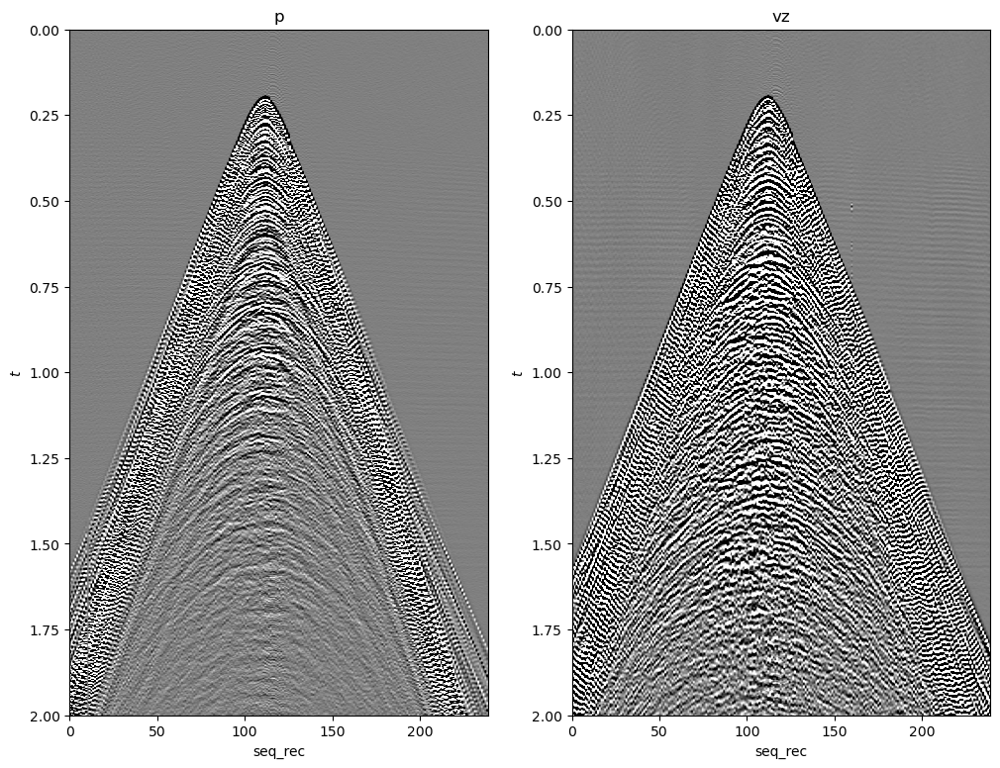

In [536]:
# -------------------p2 vz2 after removing the bad traces away-----------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 9))
axs[0].imshow(p2.T, cmap='gray', vmin=-0.0007*np.abs(p1).max(), vmax=0.0007*np.abs(p1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('p'), axs[0].set_ylabel(r'$t$')
axs[0].set_xlabel('seq_rec')
axs[0].axis('tight')
axs[0].set_ylim(2, 0);
axs[1].imshow(vz2.T, cmap='gray', vmin=-0.0007*np.abs(vz1).max(), vmax=0.0007*np.abs(vz1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('vz'),  axs[1].set_ylabel(r'$t$')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);

In [537]:
# remove the aliasing effects for p 
from scipy.signal import butter, filtfilt

def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = filtfilt(b, a, data)
    return y

nffts=(2**11, 2**11)
# remove the aliasing effects for p1
pfilt1 = butter_lowpass_filter(p1, 55., 1/sg.dt, 11)
Pfiltfk1 = np.fft.fft2(pfilt1, s=nffts)

# remove the aliasing effects for vz1
pfilt2 = butter_lowpass_filter(vz1, 55., 1/sg.dt, 11)
Pfiltfk2 = np.fft.fft2(pfilt2, s=nffts)
tgain = np.sqrt(sg.t)
p_c1=pfilt1.T * tgain[:, np.newaxis]
vz_c1=pfilt2.T * tgain[:, np.newaxis]

# remove the aliasing effects for p2
pfilt3 = butter_lowpass_filter(p2, 55., 1/sg.dt, 11)
Pfiltfk3 = np.fft.fft2(pfilt3, s=nffts)

# remove the aliasing effects for vz2
pfilt4 = butter_lowpass_filter(vz2, 55., 1/sg.dt, 11)
Pfiltfk4 = np.fft.fft2(pfilt4, s=nffts)
tgain = np.sqrt(sg.t)
p_c2=pfilt3.T * tgain[:, np.newaxis]
vz_c2=pfilt4.T * tgain[:, np.newaxis]


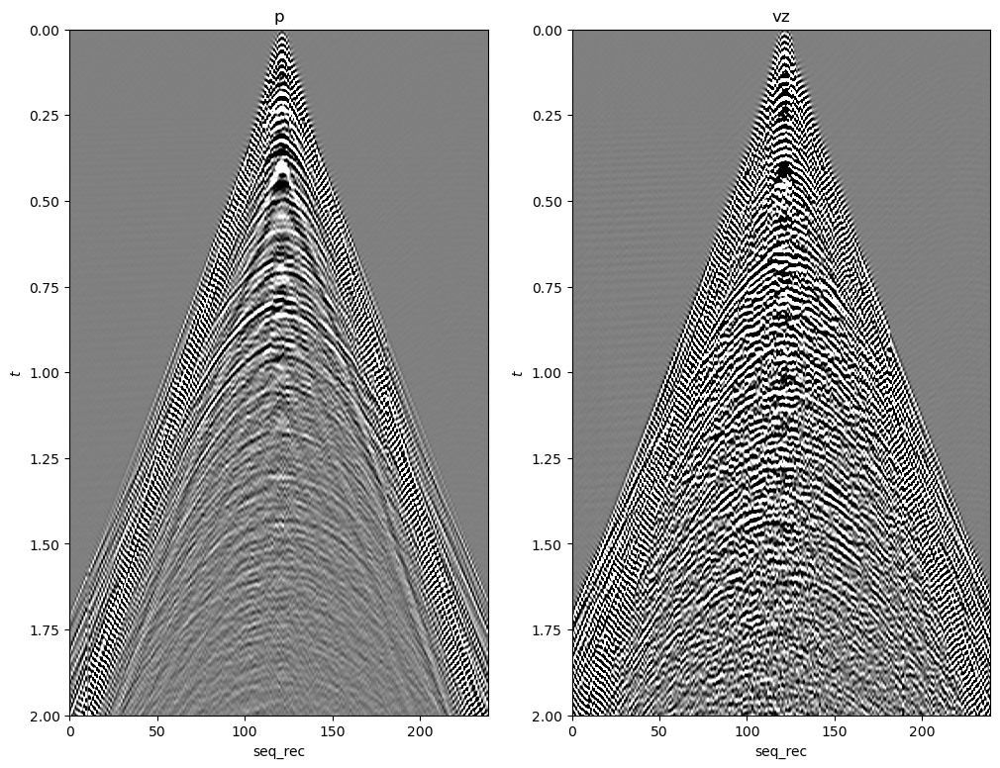

In [538]:
# -------------------p1 vz1 after processing-----------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 9))
axs[0].imshow(p_c1, cmap='gray', vmin=-0.0007*np.abs(p1).max(), vmax=0.0007*np.abs(p1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('p'),  axs[0].set_ylabel(r'$t$')
axs[0].set_xlabel('seq_rec')
axs[0].axis('tight')
axs[0].set_ylim(2, 0);
axs[1].imshow(vz_c1, cmap='gray', vmin=-0.0007*np.abs(vz1).max(), vmax=0.0007*np.abs(vz1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('vz'), axs[1].set_ylabel(r'$t$')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);

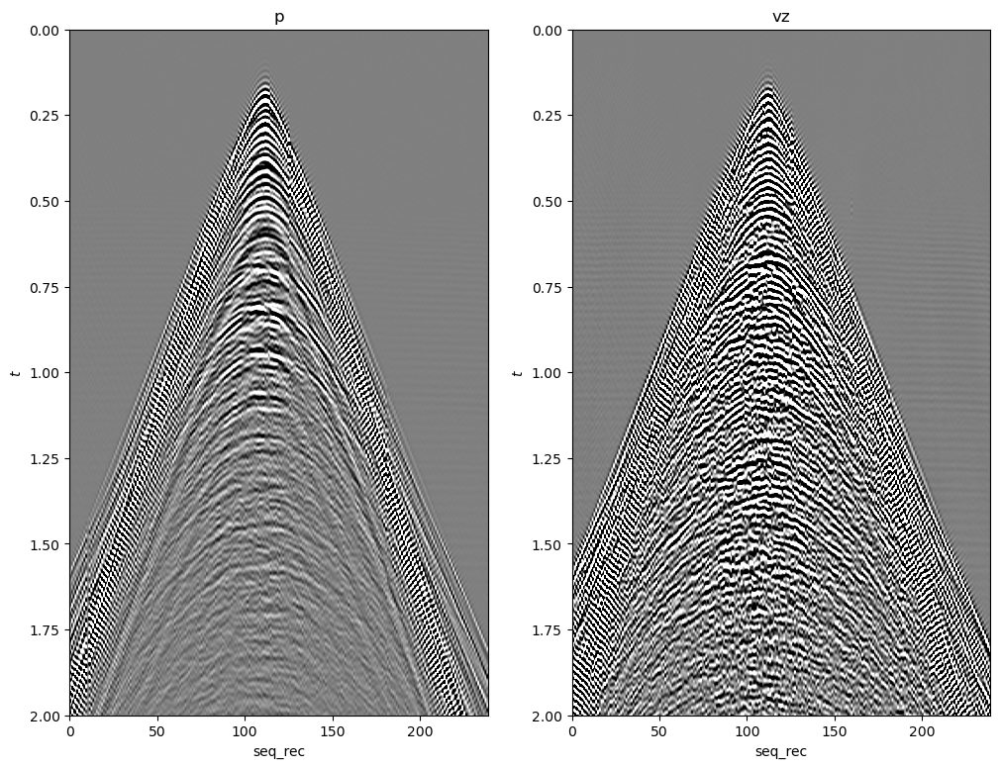

In [539]:
# -------------------p2 vz2 after processing-----------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 9))
axs[0].imshow(p_c2, cmap='gray', vmin=-0.0007*np.abs(p1).max(), vmax=0.0007*np.abs(p1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('p'),  axs[0].set_ylabel(r'$t$')
axs[0].set_xlabel('seq_rec')
axs[0].axis('tight')
axs[0].set_ylim(2, 0);
axs[1].imshow(vz_c2, cmap='gray', vmin=-0.0007*np.abs(vz1).max(), vmax=0.0007*np.abs(vz1).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('vz'), axs[1].set_ylabel(r'$t$')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);

In [540]:
np.shape(p_c1)


(5000, 236)

Working with source 0
Working with source 1


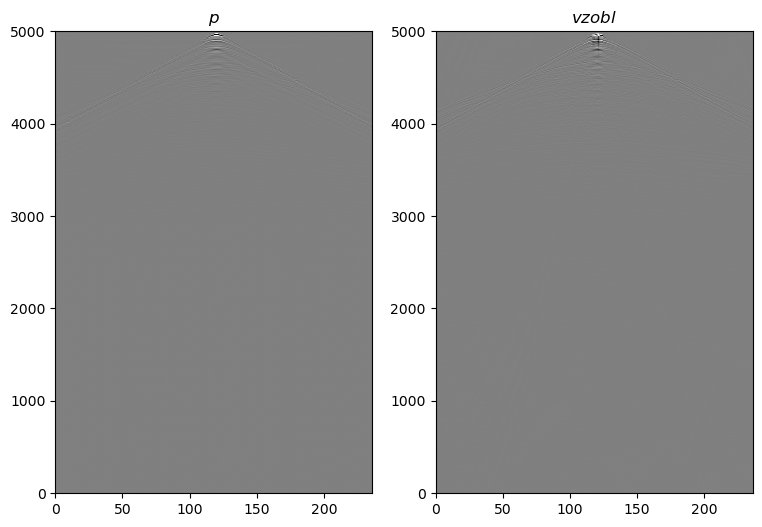

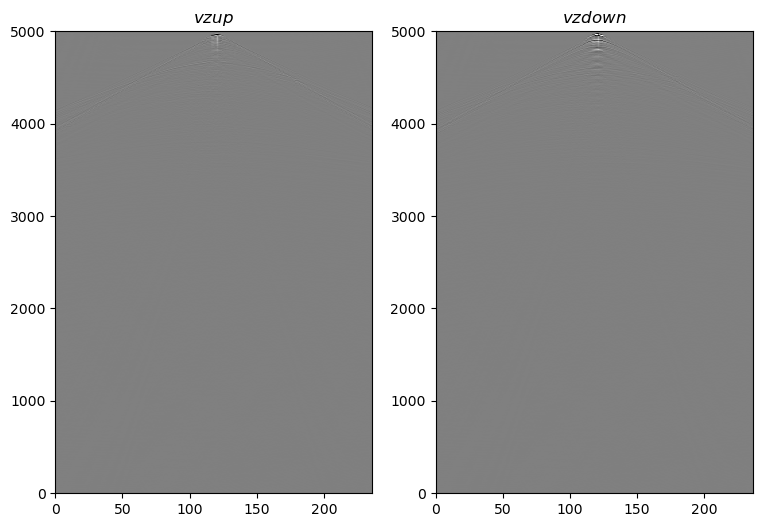

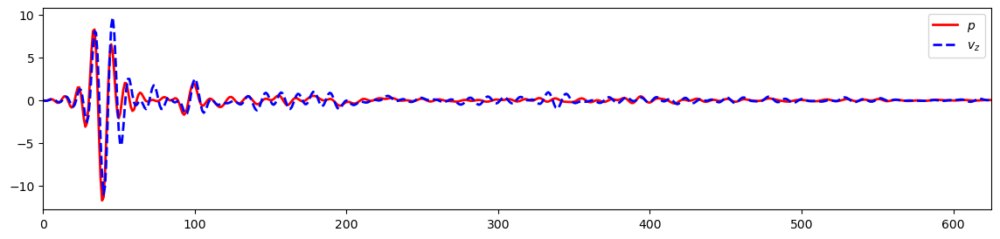

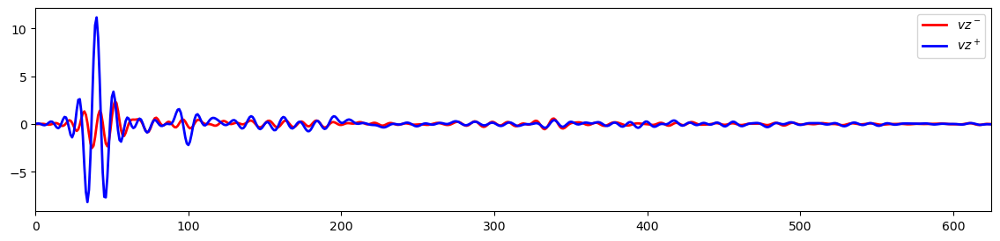

In [541]:
# wavefield sepration
p=np.zeros((2,236,5000), dtype=float)
vz=np.zeros((2,236,5000), dtype=float)

p[0]=-p_c1.T
vz[0]=vz_c1.T/50000

p[1]=-p_c2.T
vz[1]=vz_c2.T/50000

# can rarefy time traces
p_f=p[:,:,::1]
vz_f=vz[:,:,::1]
rho_sep = 1000      # density at receiver
vel_sep = 1660      # velocity at receiver
dt=sg.t[1]-sg.t[0]
dr=offsetreg[1]-offsetreg[0]
nffts=(2**11, 2**11)

vzup_q, vzdown_q =wavefield_separation(p_f, vz_f, dt, dr, rho_sep, vel_sep, nffts=nffts,
                                       critical=110, ntaper=51, verb=True, plotflag=True)

(2.0, 0.0)

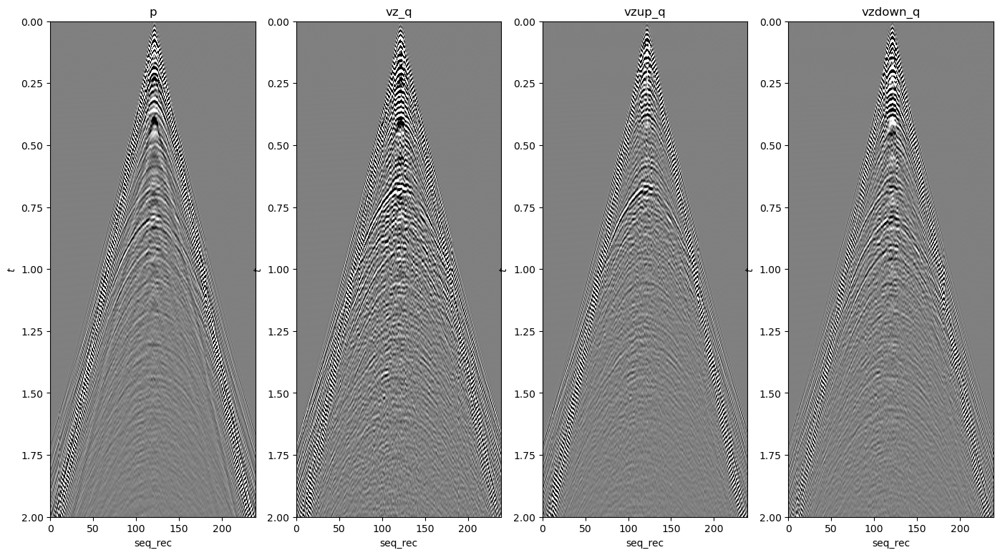

In [542]:
sz=0.027
fig, axs = plt.subplots(1, 4, figsize=(17, 9))
axs[0].imshow(p_f[0].T, cmap='gray', vmin=-sz*np.abs(p).max(), vmax=sz*np.abs(p).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('p'),  axs[0].set_ylabel(r'$t$')
axs[0].set_xlabel('seq_rec')
axs[0].axis('tight')
axs[1].imshow(vz_f[0].T, cmap='gray', vmin=-sz*np.abs(vz).max(), vmax=sz*np.abs(vz).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('vz_q'),  axs[1].set_ylabel(r'$t$')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[2].imshow(vzup_q[0].T, cmap='gray', vmin=-sz*np.abs(vz).max(), vmax=sz*np.abs(vz).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[2].set_title('vzup_q'), axs[2].set_ylabel(r'$t$')
axs[2].set_xlabel('seq_rec')
axs[2].axis('tight')
axs[3].imshow(vzdown_q[0].T, cmap='gray', vmin=-sz*np.abs(vz).max(), vmax=sz*np.abs(vz).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[3].set_title('vzdown_q'), axs[3].set_ylabel(r'$t$')
axs[3].set_xlabel('seq_rec')
axs[3].axis('tight')
axs[0].set_ylim(2, 0)
axs[1].set_ylim(2, 0)
axs[2].set_ylim(2, 0)
axs[3].set_ylim(2, 0)

(2.0, 0.0)

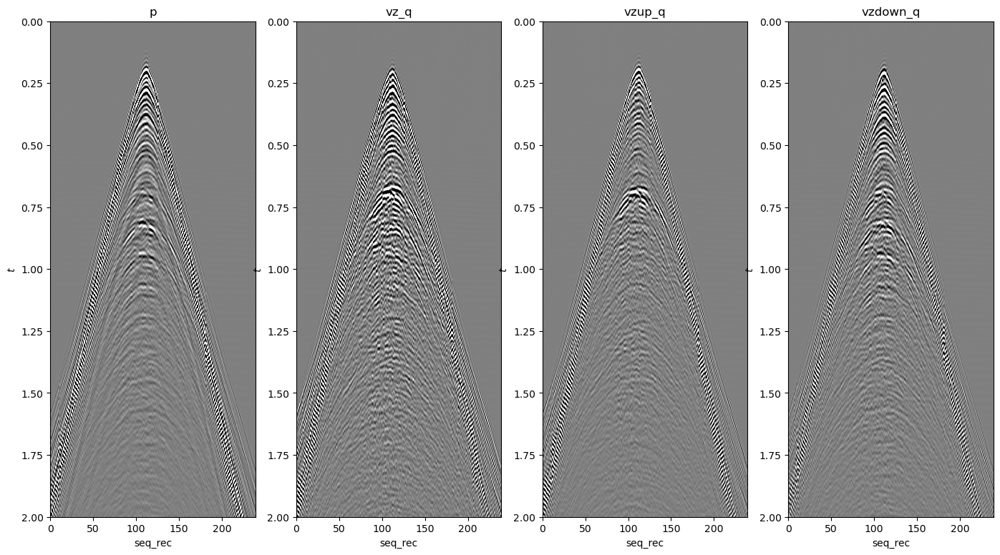

In [543]:
sz=0.03
fig, axs = plt.subplots(1, 4, figsize=(17, 9))
axs[0].imshow(p_f[1].T, cmap='gray', vmin=-sz*np.abs(p).max(), vmax=sz*np.abs(p).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[0].set_title('p'),  axs[0].set_ylabel(r'$t$')
axs[0].set_xlabel('seq_rec')
axs[0].axis('tight')
axs[1].imshow(vz_f[1].T, cmap='gray', vmin=-sz*np.abs(vz).max(), vmax=sz*np.abs(vz).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[1].set_title('vz_q'),  axs[1].set_ylabel(r'$t$')
axs[1].set_xlabel('seq_rec')
axs[1].axis('tight')
axs[2].imshow(vzup_q[1].T, cmap='gray', vmin=-sz*np.abs(vz).max(), vmax=sz*np.abs(vz).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[2].set_title('vzup_q'), axs[2].set_ylabel(r'$t$')
axs[2].set_xlabel('seq_rec')
axs[2].axis('tight')
axs[3].imshow(vzdown_q[1].T, cmap='gray', vmin=-sz*np.abs(vz).max(), vmax=sz*np.abs(vz).max(),
              extent = (a[0], a[-1], sg.t[-1], sg.t[0]))
axs[3].set_title('vzdown_q'), axs[3].set_ylabel(r'$t$')
axs[3].set_xlabel('seq_rec')
axs[3].axis('tight')
axs[0].set_ylim(2, 0)
axs[1].set_ylim(2, 0)
axs[2].set_ylim(2, 0)
axs[3].set_ylim(2, 0)